## Diabetes Dataset
### Objective :- To predict if a person is diabetic on basis of various health factors.

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_excel(r"C:\Users\tanus\Downloads\diabetes_data.xlsx")
df.head(5)

,Diabetes,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
0,0,1,0,1,26,0,0,0,1,0,1,0,1,3,5,30,0,1,4
1,0,1,1,1,26,1,1,0,0,1,0,0,1,3,0,0,0,1,12
2,0,0,0,1,26,0,0,0,1,1,1,0,1,1,0,10,0,1,13
3,0,1,1,1,28,1,0,0,1,1,1,0,1,3,0,3,0,1,11
4,0,0,0,1,29,1,0,0,1,1,1,0,1,2,0,0,0,0,8


In [3]:
df.shape

(70692, 19)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Diabetes                70692 non-null  int64
 1   HighBP                  70692 non-null  int64
 2   High_Cholesterol        70692 non-null  int64
 3   CholCheck               70692 non-null  int64
 4   BMI                     70692 non-null  int64
 5   Smoker                  70692 non-null  int64
 6   Stroke                  70692 non-null  int64
 7   HeartDisease_or_Attack  70692 non-null  int64
 8   PhysActivity            70692 non-null  int64
 9   Fruits_consumption      70692 non-null  int64
 10  Veggies_consumption     70692 non-null  int64
 11  HvyAlcoholConsump       70692 non-null  int64
 12  AnyHealthcare           70692 non-null  int64
 13  GenHlth                 70692 non-null  int64
 14  MentHlth                70692 non-null  int64
 15  PhysHlth           

In [5]:
df.describe()

,Diabetes,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
count,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000
mean,0.500000,0.563458,0.525703,0.975259,29.856985,0.475273,0.062171,0.147810,0.703036,0.611795,0.788774,0.042721,0.954960,2.837082,3.752037,5.810417,0.252730,0.456997,8.584055
std,0.500004,0.495960,0.499342,0.155336,7.113954,0.499392,0.241468,0.354914,0.456924,0.487345,0.408181,0.202228,0.207394,1.113565,8.155627,10.062261,0.434581,0.498151,2.852153
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,7.000000
50%,0.500000,1.000000,1.000000,1.000000,29.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,9.000000
75%,1.000000,1.000000,1.000000,1.000000,33.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,4.000000,2.000000,6.000000,1.000000,1.000000,11.000000
max,1.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000


### Missing values 

In [6]:
df.isnull().sum()

Diabetes                  0
HighBP                    0
High_Cholesterol          0
CholCheck                 0
BMI                       0
Smoker                    0
Stroke                    0
HeartDisease_or_Attack    0
PhysActivity              0
Fruits_consumption        0
Veggies_consumption       0
HvyAlcoholConsump         0
AnyHealthcare             0
GenHlth                   0
MentHlth                  0
PhysHlth                  0
DiffWalk                  0
Sex                       0
Age                       0
dtype: int64

#### So there are no missing values in data. 

### Correlation 

In [7]:
df.corr()

,Diabetes,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
Diabetes,1.000000,0.381516,0.289213,0.115382,0.293373,0.085999,0.125427,0.211523,-0.158666,-0.054077,-0.079293,-0.094853,0.023191,0.407612,0.087029,0.213081,0.272646,0.044413,0.278738
HighBP,0.381516,1.000000,0.316515,0.103283,0.241019,0.087438,0.129060,0.210750,-0.136102,-0.040852,-0.066624,-0.027030,0.035764,0.320540,0.064294,0.173922,0.234784,0.040819,0.338132
High_Cholesterol,0.289213,0.316515,1.000000,0.085981,0.131309,0.093398,0.099786,0.181187,-0.090453,-0.047384,-0.042836,-0.025443,0.031532,0.237778,0.083881,0.142610,0.162043,0.017324,0.240338
CholCheck,0.115382,0.103283,0.085981,1.000000,0.045648,-0.004331,0.022529,0.043497,-0.008249,0.017384,0.000349,-0.027146,0.106800,0.059213,-0.010660,0.034540,0.044430,-0.007991,0.101743
BMI,0.293373,0.241019,0.131309,0.045648,1.000000,0.011551,0.022931,0.060355,-0.170936,-0.084505,-0.056528,-0.058232,-0.013417,0.267888,0.104682,0.161862,0.246094,0.000827,-0.038648
Smoker,0.085999,0.087438,0.093398,-0.004331,0.011551,1.000000,0.064658,0.124418,-0.079823,-0.074811,-0.029926,0.077835,-0.012939,0.152416,0.091257,0.120698,0.119789,0.112125,0.105424
Stroke,0.125427,0.129060,0.099786,0.022529,0.022931,0.064658,1.000000,0.223394,-0.079985,-0.008996,-0.047601,-0.023395,0.006484,0.189447,0.087303,0.164488,0.192266,0.003822,0.123879
HeartDisease_or_Attack,0.211523,0.210750,0.181187,0.043497,0.060355,0.124418,0.223394,1.000000,-0.098223,-0.019436,-0.036315,-0.037130,0.015687,0.275868,0.075057,0.198416,0.232611,0.098161,0.221878
PhysActivity,-0.158666,-0.136102,-0.090453,-0.008249,-0.170936,-0.079823,-0.079985,-0.098223,1.000000,0.133813,0.149322,0.019111,0.027089,-0.273548,-0.130090,-0.234500,-0.276868,0.051753,-0.100753
Fruits_consumption,-0.054077,-0.040852,-0.047384,0.017384,-0.084505,-0.074811,-0.008996,-0.019436,0.133813,1.000000,0.238605,-0.033246,0.029385,-0.098687,-0.062102,-0.048572,-0.050784,-0.088723,0.061096


In [8]:
import plotly.express as px

fig = px.pie(df,names='Diabetes',color='Diabetes',
             color_discrete_map={'Yes':'red',
                                 'No':'green'})
fig.show()

### Outliers

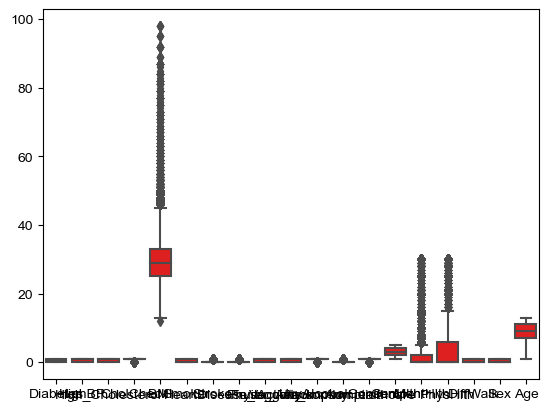

In [9]:
sns.boxplot(data=df, color='red')
sns.set(rc={'figure.figsize':(20,5)})

### Removing outliers

In [10]:
for i in df:                  # i = column name
    if df[i].dtypes in ("float64","int64"): # df[i] = every column will select float & int column only
        q1 = df[i].quantile(0.25)  # for 1 column compute q1
        q3 = df[i].quantile(0.75)  # for 1 column compute q3
        iqr = q3-q1  # for 1 column compute IQR
        ul = q3 + 1.5*iqr # for 1 column compute UPPER LIMIT
        ll = q1 - 1.5*iqr # for 1 column compute LOWER LIMIT
        df[i].clip(lower=ll,upper=ul,inplace=True)

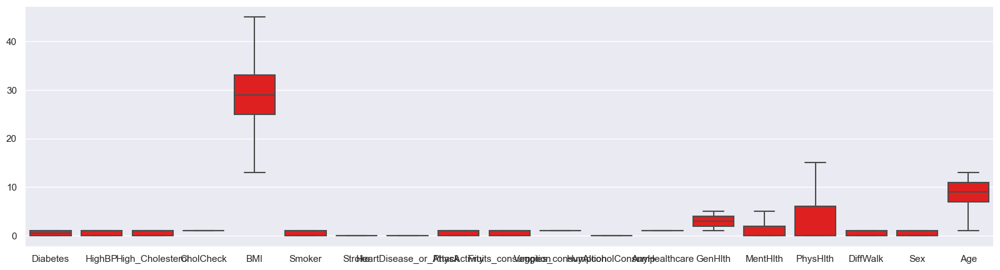

In [11]:
sns.boxplot(data=df, color='red')
sns.set(rc={'figure.figsize':(20,5)})

## Splitting data into train and test datasets

In [12]:
from sklearn.model_selection import train_test_split

X = df.drop('Diabetes', axis = 1)
Y = df['Diabetes']

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=56)

# Logistic Regression 

In [13]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LogisticRegression

# Initialize Logistic Regression model
logreg = LogisticRegression(multi_class='multinomial')


# Initialize SelectKBest with chi-squared scoring function
selector = SelectKBest(score_func=chi2, k=5)

# Fit SelectKBest on training data
selector.fit(X_train,y_train)

# Get selected feature indices
selected_features_indices = selector.get_support(indices=True)

# Get selected feature names
selected_feature_names = X_train.columns[selected_features_indices]

# Transform training data to include only selected features
X_train_selected = selector.transform(X_train)

# Fit Logistic Regression on selected features
logreg.fit(X_train_selected,y_train)


LogisticRegression(multi_class='multinomial')

In [14]:
selected_feature_names

Index(['HighBP', 'BMI', 'GenHlth', 'PhysHlth', 'Age'], dtype='object')

* Now we got some selected feature names using chi_sqaure.

In [15]:
X_train

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
17866,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10
18774,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10
13930,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12
23731,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6
36509,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65769,0,0,1,31,0,0,0,1,1,1,0,1,4,0,0,0,1,9
42106,1,1,1,31,0,0,0,1,0,1,0,1,2,2,0,0,1,7
25835,1,0,1,27,1,0,0,1,0,1,0,1,3,0,0,0,1,11
3264,0,1,1,30,0,0,0,1,0,1,0,1,2,0,14,0,0,10


## Prediction on train data

In [16]:
# Predict on the training data using the model
y_train_pred = logreg.predict(X_train_selected)

## Model performance on train dataset

In [17]:
#  model performance on training data
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Training Accuracy:", train_accuracy)

Training Accuracy: 0.7380333492476084


* So the accuracy is 73% 
* Hence model is a good fit on training data.

## Classification report

In [18]:
from sklearn.metrics import classification_report,confusion_matrix

print("Classification Report for Training Data:")
print(classification_report(y_train, y_train_pred))

Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.75      0.71      0.73     28205
           1       0.73      0.76      0.74     28348

    accuracy                           0.74     56553
   macro avg       0.74      0.74      0.74     56553
weighted avg       0.74      0.74      0.74     56553



* Accuracy of Model is 74%,Hence Model is good Fit
* Accuracy of Bad Customer Capture by Model is 76% ( Sensitivity )
* Accuracy of Good Customer Capture by Model is 71% (Specificity)

## Confusion matrix for training data 

In [19]:
conf_matrix = confusion_matrix(y_train, y_train_pred)
print("Confusion Matrix:\n", conf_matrix)

Confusion Matrix:
 [[20107  8098]
 [ 6717 21631]]


## Prediction on test data 

In [20]:
X_test_selected = selector.transform(X_test)
y_test_pred = logreg.predict(X_test_selected)


## Model performance on test dataset

In [21]:
# model performance on test data
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Test Accuracy:", test_accuracy)

Test Accuracy: 0.7453143786689299


* Accuracy is 74%
* Hence model is good fit on test data.

## Classification report

In [22]:
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))


Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.76      0.72      0.74      7141
           1       0.73      0.77      0.75      6998

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.75     14139
weighted avg       0.75      0.75      0.75     14139



* Accuracy of Model is 75%,Hence Model is good Fit
* Accuracy of Bad Customer Capture by Model is 77% ( Sensitivity )
* Accuracy of Good Customer Capture by Model is 72% (Specificity)

## Confusion Matrix

In [23]:
conf_matrix = confusion_matrix(y_test, y_test_pred)
print("Confusion Matrix:\n", conf_matrix)

Confusion Matrix:
 [[5173 1968]
 [1633 5365]]


# Decision Tree 

In [24]:
df.Diabetes.value_counts(normalize=True)

Diabetes
0    0.5
1    0.5
Name: proportion, dtype: float64

In [25]:
import plotly.express as px

fig = px.pie(df,names='Diabetes',color='Diabetes',
             color_discrete_map={'Yes':'red',
                                 'No':'green'})
fig.show()

In [26]:
df.Diabetes.value_counts()

Diabetes
0    35346
1    35346
Name: count, dtype: int64

## Model Building 

In [27]:
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor

dt = DecisionTreeClassifier()  # by default it use Gini index for split
dt.fit(X_train,y_train)  # Model = dt

DecisionTreeClassifier()

In [28]:
train = pd.concat([y_train,X_train],axis=1)
train.head()

,Diabetes,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
17866,0,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10
18774,0,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10
13930,0,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12
23731,0,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6
36509,1,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9


In [29]:
independent_variable = ['HighBP','High_Cholesterol','CholCheck','BMI','Smoker','Stroke','HeartDisease_or_Attack','PhysActivity','Fruits_consumption','Veggies_consumption','HvyAlcoholConsump','AnyHealthcare','GenHlth','MentHlth','PhysHlth','DiffWalk','Sex','Age']

In [30]:
#from sklearn.tree import export_graphviz
#from six import StringIO  
#from IPython.display import Image  
#import pydotplus

#dot_data = StringIO()
#export_graphviz(dt, out_file=dot_data,  
                #filled=True, rounded=True,
                #special_characters=True,feature_names = independent_variable,class_names=['0','1'])
#graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#graph.write_png('diabetes.png')
#Image(graph.create_png())

### Prediction on train data 

In [31]:
train['Predicted'] = dt.predict(X_train)  # MODEL = dt
train.head()

,Diabetes,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Predicted
17866,0,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10,0
18774,0,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10,1
13930,0,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12,0
23731,0,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6,0
36509,1,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9,0


### confusion matrix of training data 

In [32]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(train['Predicted'],train['Diabetes'])
print(matrix)

[[27560  2216]
 [  645 26132]]


### Accuracy of trained data 

In [33]:
Accuracy_Train=((27560+26132)/(56553)*100)
print("Accuracy:",Accuracy_Train)

Accuracy: 94.94102876947288


* Accuracy is 94%
* Hence model is overfitting on training data

In [34]:
from sklearn.metrics import classification_report
print(classification_report(train['Diabetes'], train['Predicted']))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     28205
           1       0.98      0.92      0.95     28348

    accuracy                           0.95     56553
   macro avg       0.95      0.95      0.95     56553
weighted avg       0.95      0.95      0.95     56553



### Prediction on test data

In [35]:
test = pd.concat([X_test,y_test],axis=1)
test.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes
1869,1,0,1,34,1,0,0,1,1,1,0,1,3,0,0,0,1,11,0
3506,0,0,1,19,0,0,0,1,1,1,0,1,1,0,0,0,0,10,0
51378,1,1,1,29,1,0,0,0,1,1,0,1,3,0,0,1,0,8,1
30465,0,0,1,24,1,0,0,1,0,1,0,1,2,0,0,0,1,3,0
30540,1,1,1,28,1,0,0,0,0,1,0,1,3,5,15,1,1,8,0


In [36]:
test['Predicted'] = dt.predict(X_test)
test.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes,Predicted
1869,1,0,1,34,1,0,0,1,1,1,0,1,3,0,0,0,1,11,0,1
3506,0,0,1,19,0,0,0,1,1,1,0,1,1,0,0,0,0,10,0,0
51378,1,1,1,29,1,0,0,0,1,1,0,1,3,0,0,1,0,8,1,1
30465,0,0,1,24,1,0,0,1,0,1,0,1,2,0,0,0,1,3,0,0
30540,1,1,1,28,1,0,0,0,0,1,0,1,3,5,15,1,1,8,0,0


In [37]:
confusion_matrix = confusion_matrix(test['Predicted'],test['Diabetes'])
print(confusion_matrix)

[[4917 2579]
 [2224 4419]]


### Accuracy of test data 

In [38]:
Accuracy_Test=((4940 +4454)/(14139)*100)
print("Accuracy:",Accuracy_Test)

Accuracy: 66.44034231558102


* Accuracy is 66% 
* Hence model is not a good fit.

### Model Improvement by Pruning Method

In [39]:
from sklearn.tree import DecisionTreeClassifier

dt1 = DecisionTreeClassifier(criterion='gini',  #splitter
                                 min_samples_leaf=100, ## child
                                 min_samples_split=150, #parent
                                 max_depth=4)  #branches
#Train the model using the training sets
dt1.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, min_samples_leaf=100, min_samples_split=150)

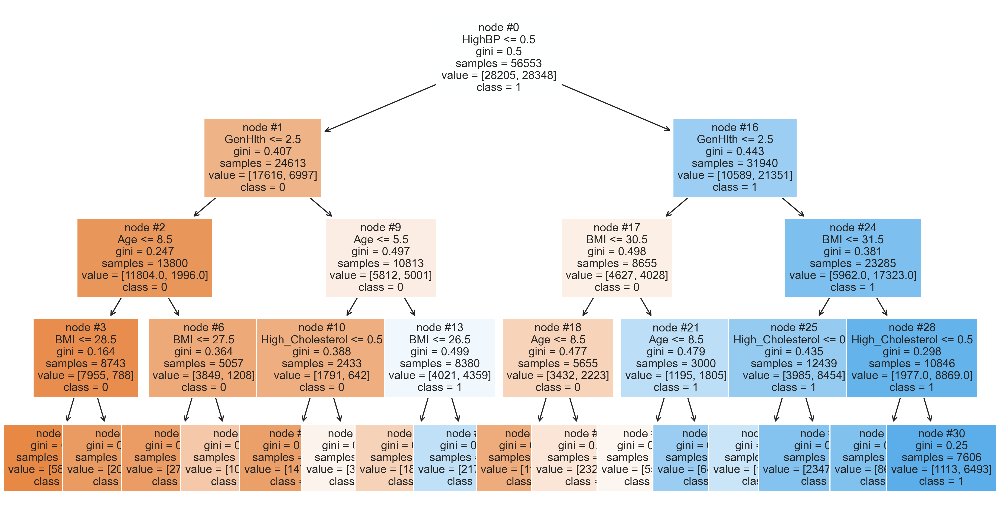

In [40]:
from sklearn import tree
import matplotlib.pyplot as plt

Diabetes=['0', '1']  # array
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (15,8), dpi=300)
tree.plot_tree(dt1,  # Model
               feature_names = independent_variable,  # column name
               class_names = Diabetes, # Yes , No
               filled = True, # colour
               node_ids = True, # node number
               fontsize=10);

### Prediction on training data after pruning

In [41]:
train['Predicted'] = dt1.predict(X_train)  # MODEL = dt
train.head()

,Diabetes,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Predicted
17866,0,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10,1
18774,0,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10,0
13930,0,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12,0
23731,0,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6,0
36509,1,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9,0


### Final accuracy of Model after Pruning

In [42]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(train['Predicted'],train['Diabetes'])
print(matrix)

[[19432  6555]
 [ 8773 21793]]


In [43]:
Accuracy_Train=((19432+21793)/(56553)*100)
print("Accuracy:",Accuracy_Train)

Accuracy: 72.89622124378901


* Accuracy is 72%
* hence model is good fit on traning data .

In [44]:
from sklearn.metrics import classification_report
print(classification_report(train['Diabetes'], train['Predicted']))

              precision    recall  f1-score   support

           0       0.75      0.69      0.72     28205
           1       0.71      0.77      0.74     28348

    accuracy                           0.73     56553
   macro avg       0.73      0.73      0.73     56553
weighted avg       0.73      0.73      0.73     56553



### Prediction on test data 

In [45]:
test = pd.concat([X_test,y_test],axis=1)
test.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes
1869,1,0,1,34,1,0,0,1,1,1,0,1,3,0,0,0,1,11,0
3506,0,0,1,19,0,0,0,1,1,1,0,1,1,0,0,0,0,10,0
51378,1,1,1,29,1,0,0,0,1,1,0,1,3,0,0,1,0,8,1
30465,0,0,1,24,1,0,0,1,0,1,0,1,2,0,0,0,1,3,0
30540,1,1,1,28,1,0,0,0,0,1,0,1,3,5,15,1,1,8,0


In [46]:
test['Predicted'] = dt1.predict(X_test)
test.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes,Predicted
1869,1,0,1,34,1,0,0,1,1,1,0,1,3,0,0,0,1,11,0,1
3506,0,0,1,19,0,0,0,1,1,1,0,1,1,0,0,0,0,10,0,0
51378,1,1,1,29,1,0,0,0,1,1,0,1,3,0,0,1,0,8,1,1
30465,0,0,1,24,1,0,0,1,0,1,0,1,2,0,0,0,1,3,0,0
30540,1,1,1,28,1,0,0,0,0,1,0,1,3,5,15,1,1,8,0,1


### Confusion matrix of test data 

In [47]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(test['Predicted'],test['Diabetes'])
print(confusion_matrix)

[[4973 1648]
 [2168 5350]]


In [48]:
4973+ 1648+2168 +5350

14139

### Accuracy on test data 

In [49]:
Accuracy_test=((4973   +5350)/(14139)*100)
print("Accuracy:",Accuracy_test)

Accuracy: 73.01082113303629


* Accuracy is 73% 
* Model is a good fit on test data 

### classification report of test data

In [50]:
from sklearn.metrics import classification_report
print(classification_report(test['Diabetes'], test['Predicted']))

              precision    recall  f1-score   support

           0       0.75      0.70      0.72      7141
           1       0.71      0.76      0.74      6998

    accuracy                           0.73     14139
   macro avg       0.73      0.73      0.73     14139
weighted avg       0.73      0.73      0.73     14139



* Accuracy of Model is 73%,Hence Model is good Fit
* Accuracy of Bad Customer Capture by Model is 76% ( Sensitivity )
* Accuracy of Good Customer Capture by Model is 70% (Specificity)

# Random Forest 

In [51]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier

Model_rf = RandomForestClassifier(random_state=20,
                               n_estimators=25, # make 25 tress
                               criterion="gini",
                               max_depth=4,  # each tree will have 4 branches
                               min_samples_split=100,# each tree will have parent node
                               min_samples_leaf=50,# each tree will have Child node
                               max_features="sqrt")# n_estimators means number tree we want  

Model_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=4, min_samples_leaf=50, min_samples_split=100,
                       n_estimators=25, random_state=20)

###  Selecting important feature 

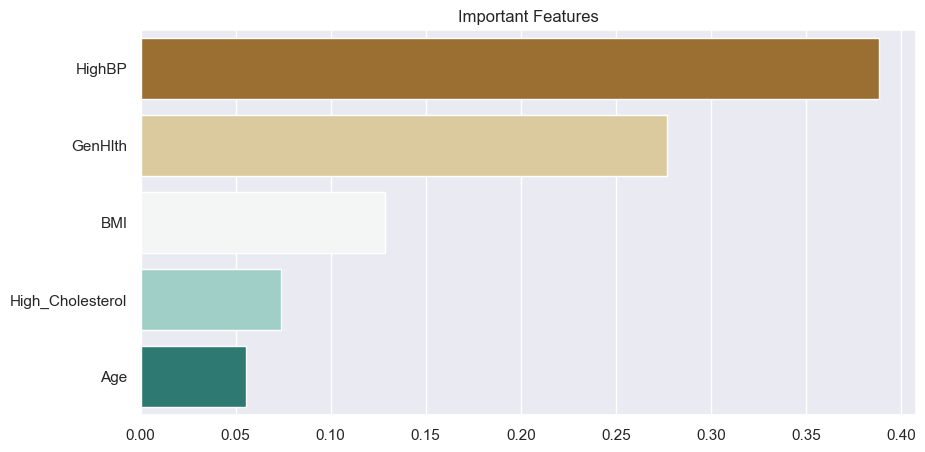

In [52]:
imp = pd.Series(data=Model_rf.feature_importances_, index=Model_rf.feature_names_in_).sort_values(ascending=False)
plt.figure(figsize=(10,5))
plt.title("Important Features")
ax = sns.barplot(y=imp.head().index, x=imp.head().values, palette="BrBG", orient='h')


#### Top 5 features are
* HighBP 
* GenHlth
* BMI
* High_cholesterol
* Age

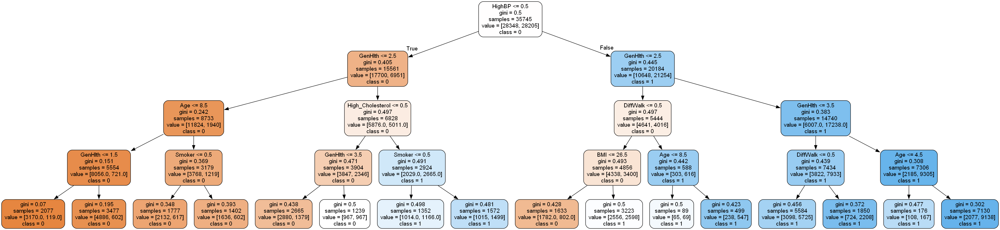

In [53]:
from sklearn.tree import export_graphviz
import pydot

feature_list = list(X.columns)  # all independent variable name
Diabetes=['0', '1']

tree = Model_rf.estimators_[2]  # 0-24 specify the tree number   

export_graphviz(tree, out_file = 'abc.dot', 
                feature_names = feature_list, 
                class_names = Diabetes,
                rounded = True, 
                filled=True)
(graph, ) = pydot.graph_from_dot_file('abc.dot')
graph.write_png('tree.png')
from IPython.display import Image
Image(filename = 'tree.png')


In [54]:
train = pd.concat([X_train,y_train],axis=1)
train.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes
17866,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10,0
18774,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10,0
13930,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12,0
23731,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6,0
36509,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9,1


In [55]:
train['Predicted'] = Model_rf.predict(X_train)
train.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes,Predicted
17866,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10,0,0
18774,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10,0,1
13930,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12,0,0
23731,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6,0,0
36509,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9,1,0


In [56]:
from sklearn.metrics import confusion_matrix

confusion_matrix = confusion_matrix(train['Predicted'],train['Diabetes'])
print(confusion_matrix)

[[19284  6012]
 [ 8921 22336]]


In [57]:
Accuracy_Train=((19284+22336)/(56553)*100)
print(Accuracy_Train)

73.59468109560943


In [58]:
from sklearn.metrics import classification_report
print(classification_report(train['Diabetes'], train['Predicted']))

              precision    recall  f1-score   support

           0       0.76      0.68      0.72     28205
           1       0.71      0.79      0.75     28348

    accuracy                           0.74     56553
   macro avg       0.74      0.74      0.74     56553
weighted avg       0.74      0.74      0.74     56553



In [59]:
test = pd.concat([X_test,y_test],axis=1)
test.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes
1869,1,0,1,34,1,0,0,1,1,1,0,1,3,0,0,0,1,11,0
3506,0,0,1,19,0,0,0,1,1,1,0,1,1,0,0,0,0,10,0
51378,1,1,1,29,1,0,0,0,1,1,0,1,3,0,0,1,0,8,1
30465,0,0,1,24,1,0,0,1,0,1,0,1,2,0,0,0,1,3,0
30540,1,1,1,28,1,0,0,0,0,1,0,1,3,5,15,1,1,8,0


In [60]:
test['Predicted'] = Model_rf.predict(X_test)
test.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Diabetes,Predicted
1869,1,0,1,34,1,0,0,1,1,1,0,1,3,0,0,0,1,11,0,1
3506,0,0,1,19,0,0,0,1,1,1,0,1,1,0,0,0,0,10,0,0
51378,1,1,1,29,1,0,0,0,1,1,0,1,3,0,0,1,0,8,1,1
30465,0,0,1,24,1,0,0,1,0,1,0,1,2,0,0,0,1,3,0,0
30540,1,1,1,28,1,0,0,0,0,1,0,1,3,5,15,1,1,8,0,1


In [61]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(test['Predicted'],test['Diabetes'])
print(confusion_matrix)

[[4954 1489]
 [2187 5509]]


In [62]:
Accuracy_test=((4954+5509)/(14139)*100)
Accuracy_test

74.000990169036

* Accuracy is 74% 
* Model is a good fit 

In [63]:
from sklearn.metrics import classification_report
print(classification_report(test['Diabetes'], test['Predicted']))

              precision    recall  f1-score   support

           0       0.77      0.69      0.73      7141
           1       0.72      0.79      0.75      6998

    accuracy                           0.74     14139
   macro avg       0.74      0.74      0.74     14139
weighted avg       0.74      0.74      0.74     14139



### Model Export 

In [72]:
import sklearn
sklearn.__version__

'1.4.1.post1'

In [73]:
import pickle

pickle.dump(dt1, open(r"C:\Users\tanus\Desktop\CP 1 cloud deployment\build.pkl",'wb'))

In [74]:
X_train.head()

,HighBP,High_Cholesterol,CholCheck,BMI,Smoker,Stroke,HeartDisease_or_Attack,PhysActivity,Fruits_consumption,Veggies_consumption,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
17866,0,0,1,30,1,0,0,1,0,1,0,1,3,0,1,0,1,10
18774,1,1,1,30,0,0,0,1,1,1,0,1,2,0,0,0,1,10
13930,1,0,1,30,1,0,0,1,0,1,0,1,2,0,0,0,1,12
23731,0,0,1,39,1,0,0,1,0,1,0,1,2,0,0,0,0,6
36509,0,0,1,26,0,0,0,1,1,1,0,1,2,0,0,0,0,9
